In [2]:
%matplotlib inline

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import csv
import seaborn as sns
import datetime as dt
import pandas_datareader.data as web
from pandas.tseries.offsets import *
from statsmodels.formula.api import ols
import datetime

In [24]:
stock_list = pd.read_csv('D:\Max\Study\Programming\Python WD/stocklist.csv', sep=',', header=None)[0]
for i in range(len(stock_list)):
    stock_list[i] = stock_list[i] +'.ME'

# Price and volume parcing from Yahoo

In [17]:
def price_parcing(name):
    start = dt.datetime(2013, 4, 17)
    end = dt.datetime(2017, 4, 17)
    
    #prices
    prices = []

    for tic in name:
            df = web.DataReader(tic, 'yahoo', start=start, end=end)[['Close']]
            df.rename(columns={'Close': tic}, inplace=True)
            prices.append(df)

    prices = pd.concat(prices, axis=1)

    prices = prices.fillna(0)
    
    #volumes
    volumes = []

    for tic in name:
            df = web.DataReader(tic, 'yahoo', start=start, end=end)[['Volume']]
            df.rename(columns={'Volume': tic}, inplace=True)
            volumes.append(df)

    volumes = pd.concat(volumes, axis=1)

    volumes = volumes.fillna(0)
    return prices, volumes

# Index parcing from Yahoo

In [5]:
def ind_parcing():
    index = web.DataReader('MICEXINDEXCF.ME', 'yahoo', start=start, end=end)[['Close']]
    index.rename(columns={'Close': 'MICEX.ME'}, inplace=True)
    return index

# Creating returns from initial data + plotting

In [6]:
def ret(prices):
    returns = prices.apply(lambda x: 100 * np.log(x / x.shift()))
    print(returns.describe())
    plt.figure(figsize=(15,5),dpi=100)  
    plt.subplot(1,1,1,facecolor='w')   
    plt.plot(returns, linewidth=1)
    plt.ylim([-15,15])
    plt.xlim(['13-04-2013','5-05-2017'])
    plt.legend(loc='upper right')
    plt.show()
    return returns

# Density of returns

In [7]:
def density_returns(returns):
    returns.plot(kind='kde', linewidth=1, figsize=(15, 4))
    plt.xlim([-10, 10])
    plt.ylim([0, 0.4])
    plt.xlabel('Daily log-returns')

    ax = plt.gca()
    ax.spines['top'].set_color('none')
    ax.spines['right'].set_position(('data',0))

    plt.show()

# Cumulative return for all stocks + plotting

In [8]:
def cum_ret(returns):
    cumret = returns.ix['2012':].cumsum().apply(lambda x: np.exp(x / 100))
    cumret.plot(figsize=(15, 6))

    ax = plt.gca()
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_position(('data',1))

    plt.show()

# General dynamics of all stocks + shocks

In [9]:
def gen_dyn(name,prices_2):
    
    fig, axes = plt.subplots(len(name), 1, figsize=(10, 150),facecolor='w')
    for i in range(len(name)):

        company = name[i]
        ewma = prices_2.ix['2013':, [company]]

        lines = []
        for count, span in enumerate([30, 180]):
            name1 = 'EWMA(' + str(span) + ')'
            ewma[name1] = ewma[company].ewm(span=span).mean()
        ax = ewma.plot(ax=axes[i],figsize=(10, 55))


    plt.legend(loc='lower right')
    plt.tight_layout()

# Index dynamics

In [10]:
def ind_dyn(index):
    plt.figure(figsize=(10,3),dpi=100)
    plt.subplot(1,1,1,facecolor='w')
    a12 = index.ewm(span=30).mean()
    a13 = index.ewm(span=180).mean()
    plt.plot(a12,linewidth=1.0)
    plt.plot(a13,linewidth=1.0)
    plt.plot(index,linewidth=1.0)
    ax = plt.gca()
    ax.spines['left'].set_color('black')
    ax.spines['bottom'].set_color('black')

# Shocks finding function

In [11]:
def sh_ch(returns,returns_ind):
    #1-day stocks
    shocks = returns[(np.abs(returns) > 10).any(1)]
    shocks.to_csv('D:\Max\Study\Programming\Python WD/shocks.csv')
    print('Number of 1 day stocks shocks(>10%): ',len(shocks))
    
    #2-days chain stocks
    returns2 = returns.apply(lambda x: ((1+x/100) * (1+x.shift()/100)- 1)*100)
    shocks2 = returns2[(np.abs(returns2) > 15).any(1)]
    shocks2.to_csv('D:\Max\Study\Programming\Python WD/shocks2.csv')
    print('Number of 2 days stocks shocks(>15%): ',len(shocks2))
    
    #3-days chain stocks
    returns3 = returns.apply(lambda x: ((1+x/100) * (1+x.shift()/100) * (1+x.shift(2)/100) - 1)*100)
    shocks3 = returns3[(np.abs(returns3) > 18).any(1)]
    shocks3.to_csv('D:\Max\Study\Programming\Python WD/shocks3.csv')
    print('Number of 3 days stocks shocks(>18%): ',len(shocks3))
    
    #1-day index
    shocks_ind = returns_ind[(np.abs(returns_ind) > 3).any(1)]
    shocks_ind.to_csv('D:\Max\Study\Programming\Python WD/shocks_ind.csv')
    print('Number of 1 day index shocks(>3%): ',len(shocks_ind))
    
    #2-days chain index
    returns_ind2 = returns_ind.apply(lambda x: ((1+x/100) * (1+x.shift()/100)- 1)*100)
    shocks_ind2 = returns_ind2[(np.abs(returns_ind2) > 4).any(1)]
    shocks_ind2.to_csv('D:\Max\Study\Programming\Python WD/shocks_ind2.csv')
    print('Number of 2 days index shocks(>4%): ',len(shocks_ind2))
    
    #3-days chain index
    returns_ind3 = returns_ind.apply(lambda x: ((1+x/100) * (1+x.shift()/100) * (1+x.shift(2)/100) - 1)*100)
    shocks_ind3 = returns_ind3[(np.abs(returns_ind3) > 5).any(1)]
    shocks_ind3.to_csv('D:\Max\Study\Programming\Python WD/shocks_ind3.csv')
    print('Number of 3 days index shocks(>5%): ',len(shocks_ind3))

# Shocks analysing function

In [12]:
def sh_a(shock,a,b,name,prices_2):
    shock = pd.to_datetime([shock])
    start = shock + DateOffset(days=a)
    finish = shock + DateOffset(days=b)
    shock = str(shock.year[0]) + '-' + str('%02d' % shock.month) + '-' + str('%02d' % shock.day)
    start = str(start.year[0]) + '-' + str('%02d' % start.month) + '-' + str('%02d' %start.day)
    finish = str(finish.year[0]) + '-' + str('%02d' % finish.month) + '-' + str('%02d' % finish.day)
    sh_a2 = pd.DataFrame(np.zeros((3,len(name))), index = ['Cum','Min','Max'],columns = name,copy = True)
    for i in range(len(name)):
        instr = name[i]
        a1 = prices_2[instr].ewm(span=30).mean()
        a2 = prices_2[instr].ewm(span=180).mean()
        plt.figure(figsize=(8,3),dpi=100) 
        plt.subplot(1,1,1,facecolor='w')
        plt.plot(prices_2[instr][start:finish],color="blue",linewidth=1.0,label=instr)
        plt.plot(a1[start:finish],color="green",linewidth=1.0,label=instr +' EMWA 30')
        plt.plot(a2[start:finish],color="red",linewidth=1.0,label=instr +' EMWA 180')
        plt.plot([shock,shock], [prices_2[instr][shock]/1.2,prices_2[instr][shock]], color='red', linewidth=1.5,linestyle='--')
        plt.annotate(r'Shock', xy=([shock],prices_2[instr][shock]), xycoords='data',xytext=(-50,-40),\
                 textcoords='offset points', fontsize='12', arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.1"))
        plt.xlim(start,finish)
        plt.legend(loc='best')
        
        sh_a2[instr]['Cum'] = np.round(((prices_2[instr][finish]/prices_2[instr][start]-1)*100), decimals=2)
        sh_a2[instr]['Min'] = np.round(((min(prices_2[instr][start:finish])/prices_2[instr][start]-1)*100), decimals=2)
        sh_a2[instr]['Max'] = np.round(((max(prices_2[instr][start:finish])/prices_2[instr][start]-1)*100), decimals=2)
        
        sh_a2.to_csv('D:\Max\Study\Programming\Python WD/Shock-' + shock +'.csv')
    return sh_a2

# Shocks analysing function - returns

In [13]:
def retsh_a(shock,a,b,name,returns):
    shock = pd.to_datetime([shock])
    shock1 = shock + DateOffset(days=1)
    start = shock + DateOffset(days=a)
    finish = shock + DateOffset(days=b)
    shock = str(shock.year[0]) + '-' + str('%02d' % shock.month) + '-' + str('%02d' % shock.day)
    shock1 = str(shock1.year[0]) + '-' + str('%02d' % shock1.month) + '-' + str('%02d' % shock1.day)
    start = str(start.year[0]) + '-' + str('%02d' % start.month) + '-' + str('%02d' %start.day)
    finish = str(finish.year[0]) + '-' + str('%02d' % finish.month) + '-' + str('%02d' % finish.day)
    sh_a2 = pd.DataFrame(np.zeros((5,len(name))), index = ['Cum','Min','Max','CAMP','Anti'],columns = name,copy = True)
    for i in range(len(name)):
        instr = name[i]
        a1 = returns[instr].ewm(span=30).mean()
        a2 = returns[instr].ewm(span=180).mean()
        cum = []
        cum = ((returns[instr][start:finish]/100 + 1 ).cumprod() - 1)*100
        #CAMP return
        a4 = np.array(betas[instr], copy = True)
        b4 = pd.DataFrame(ret_ind1[start:finish], copy = True)
        for i in range(1, len(b4)):
            b4['MICEX.ME'][i] = b4['MICEX.ME'][i] * a4
        #CAMP strategy
        cumRET = []
        cumRET = ((returns[instr][shock1:finish]/100 + 1 ).cumprod() - 1)*100
        
        cumCAMP = []
        cumCAMP = ((b4['MICEX.ME'][shock1:finish]/100 + 1 ).cumprod() - 1)*100
        
        plt.figure(figsize=(8,3),dpi=100) 
        plt.subplot(1,1,1,facecolor='w')
        plt.plot(returns[instr][start:finish],color="blue",linewidth=1.0,label=instr)
        plt.plot(a1[start:finish],color="green",linewidth=1.0,label=instr +' EMWA 30')
        plt.plot(a2[start:finish],color="yellow",linewidth=1.0,label=instr +' EMWA 180')
        plt.plot(b4,color="red",linewidth=1.0,label=instr +' CAMP')        
        plt.plot(cum,color="black",linewidth=1.0,label=instr +' Cumulative')
        plt.plot(cumCAMP[shock:finish],linewidth=1.0,label=instr +' CAMP Strategy')
        plt.plot(cumRET[shock:finish],linewidth=1.0,label=instr +' Antishock')
        
        plt.plot([shock,shock], [0,returns[instr][shock]], color='red', linewidth=1.5,linestyle='--')
        plt.annotate(r'Shock', xy=([shock],returns[instr][shock]), xycoords='data',xytext=(20,0),\
                 textcoords='offset points', fontsize='10', arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.1"))
        plt.xlim(start,finish)
        plt.legend(loc='best', fontsize='8')
        
        ax = plt.gca()
        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('data',0))
        ax.yaxis.set_ticks_position('left')
        
        sh_a2[instr]['Cum'] = np.round(cum[finish], decimals=2)
        sh_a2[instr]['Min'] = np.round((min(returns[instr][start:finish])), decimals=2)
        sh_a2[instr]['Max'] = np.round((max(returns[instr][start:finish])), decimals=2)
        sh_a2[instr]['CAMP'] = np.round(cumCAMP[finish], decimals=2)
        sh_a2[instr]['Anti'] = np.round(cumRET[finish], decimals=2)
        
        sh_a2.to_csv('D:\Max\Study\Programming\Python WD/Shock_ret-' + shock +'.csv')
    return sh_a2

# Shocks analysing function - volumes

In [14]:
def volsh_a(shock,a,b,name,volumes):
    shock = pd.to_datetime([shock])
    shock1 = shock + DateOffset(days=1)
    start = shock + DateOffset(days=a)
    finish = shock + DateOffset(days=b)
    shock = str(shock.year[0]) + '-' + str('%02d' % shock.month) + '-' + str('%02d' % shock.day)
    shock1 = str(shock1.year[0]) + '-' + str('%02d' % shock1.month) + '-' + str('%02d' % shock1.day)
    start = str(start.year[0]) + '-' + str('%02d' % start.month) + '-' + str('%02d' %start.day)
    finish = str(finish.year[0]) + '-' + str('%02d' % finish.month) + '-' + str('%02d' % finish.day)
    sh_a2 = pd.DataFrame(np.zeros((4,len(name))), index = ['Mean','Min','Max','EMWA 30 shock'],columns = name,copy = True)
    for i in range(len(name)):
        instr = name[i]
        a1 = volumes[instr].ewm(span=30).mean()
        a2 = volumes[instr].ewm(span=180).mean()
            
        plt.figure(figsize=(8,3),dpi=100) 
        plt.subplot(1,1,1,facecolor='w')
        plt.plot(volumes[instr][start:finish],color="blue",linewidth=1.0,label=instr)
        plt.plot(a1[start:finish],color="green",linewidth=1.0,label=instr +' EMWA 30')
        plt.plot(a2[start:finish],color="yellow",linewidth=1.0,label=instr +' EMWA 180')
        
        plt.plot([shock,shock], [0,volumes[instr][shock]], color='red', linewidth=1.5,linestyle='--')
        plt.annotate(r'Shock', xy=([shock],volumes[instr][shock]), xycoords='data',xytext=(20,0),\
                 textcoords='offset points', fontsize='10', arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.1"))
        plt.xlim(start,finish)
        plt.legend(loc='best', fontsize='8')
        
        ax = plt.gca()
        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('data',0))
        ax.yaxis.set_ticks_position('left')
        
        sh_a2[instr]['Mean'] = np.round(volumes[instr][start:finish].mean(), decimals=2)
        sh_a2[instr]['Min'] = np.round((min(volumes[instr][start:finish])), decimals=2)
        sh_a2[instr]['Max'] = np.round((max(volumes[instr][start:finish])), decimals=2)
        sh_a2[instr]['EMWA 30 shock'] = np.round((a1[shock]), decimals=2)
        
        sh_a2.to_csv('D:\Max\Study\Programming\Python WD/Shock_ret_vol-' + shock +'.csv')
    return sh_a2

# CAMP beta calculation and plotting

In [15]:
def CAMP(returns,returns_ind,name):
    camp = pd.merge(returns_ind, returns, how='inner', on=None, left_on=None, right_on=None,\
         left_index=True, right_index=True, sort=True, indicator=False)
    #First method - by definition
    corr = camp.corr()
    std = camp.std()
    corr = pd.DataFrame(corr)
    betas = pd.DataFrame(np.zeros((1,len(name))), index = ['Betas'],columns = name,copy = True)
    for i in range(len(name)):
        betas[name[i]]['Betas'] = std[i]*std[0]*corr['MICEX.ME'][name[i]]
    #Other method - Weekly regressions
    betas2 = pd.DataFrame(np.zeros((1,len(name))), index = ['Betas'],columns = name,copy = True)    
    for i in range(len(name)):
        k=0
        k = 0
        l = camp.shape[0]//5
        x = pd.DataFrame(np.zeros((1,l)), index = ['MICEX.ME'],copy = True)
        y = pd.DataFrame(np.zeros((1,l)), index = [name[i]],copy = True)
        for j in np.arange(0,camp.shape[0],5):
            x[k] = camp['MICEX.ME'][j]
            y[k] = camp[name[i]][j]
            k = k+1
        x = x.T
        y = y.T
        lr = pd.merge(x, y, how='inner', on=None, left_on=None, right_on=None,\
         left_index=True, right_index=True, sort=True, indicator=False)
        model = ols("y ~ x - 1", lr).fit()
        betas2[name[i]]['Betas'] = model.params
    return camp, std, corr, betas, betas2

## Stating shock dates and window size 


In [22]:
b = '2014-02-19'
c = '2014-04-14'
d = '2014-09-17'
windmin = -14
windpl = 42

# Full list testing

In [25]:
pr, vol = price_parcing(stock_list)

RemoteDataError: Unable to read URL: http://ichart.finance.yahoo.com/table.csv

In [23]:
ind, vol_ind = ind_parcing()

NameError: name 'start' is not defined

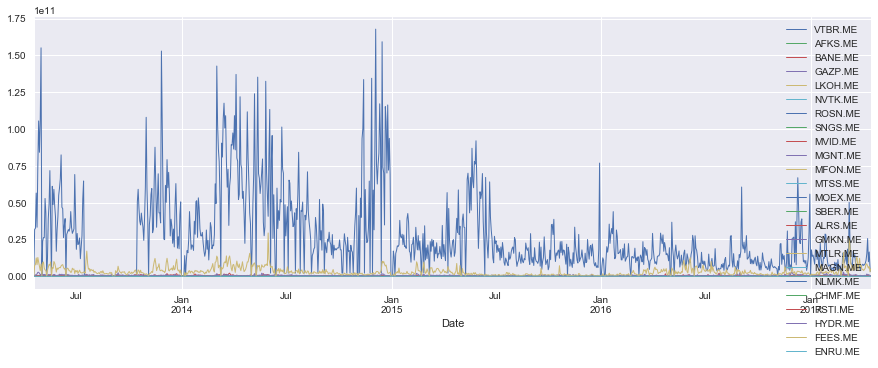

In [1565]:
vol.plot(figsize = (15,5), linewidth = 1.0)

         MICEX.ME
count  984.000000
mean     0.037791
std      1.245737
min    -11.418922
25%     -0.636092
50%     -0.000499
75%      0.754420
max      9.366964


D:\Max\Study\Programming\Anaconda43\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


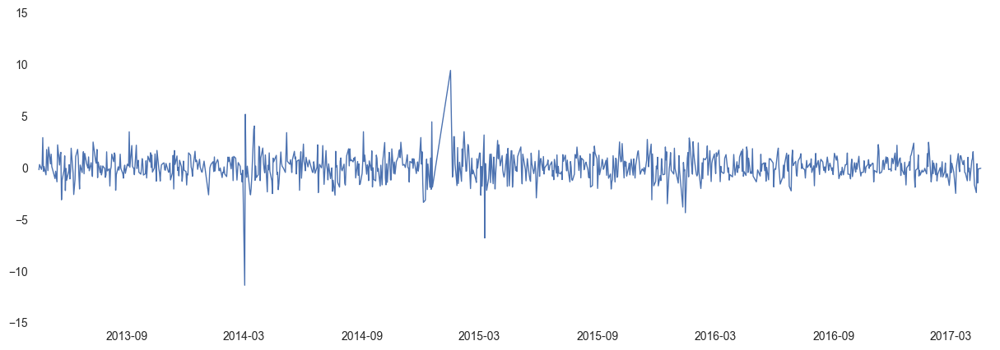

In [1601]:
ret_ind1 = ret(ind)

           VTBR.ME      AFKS.ME      BANE.ME      GAZP.ME      LKOH.ME  \
count  1043.000000  1043.000000  1043.000000  1043.000000  1043.000000   
mean      0.038584    -0.013735     0.056007     0.001484     0.039778   
std       1.802436     3.814023     2.405436     1.594120     1.572866   
min     -20.090741   -46.077842   -23.021129   -14.552135    -6.977004   
25%      -0.728413    -0.975044    -0.819942    -0.926952    -0.814994   
50%       0.000000     0.000000     0.000000     0.000000     0.000000   
75%       0.752722     1.179514     0.886395     0.814367     0.841616   
max      10.064353    72.368959    14.310084     7.357171     9.239840   

           NVTK.ME      ROSN.ME      SNGS.ME      MVID.ME      MGNT.ME  \
count  1043.000000  1043.000000  1043.000000  1043.000000  1043.000000   
mean      0.075918     0.039169     0.002651     0.044352     0.034115   
std       1.895660     1.597271     1.651328     2.184278     2.026228   
min     -16.609470    -4.919708    -5

D:\Max\Study\Programming\Anaconda43\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


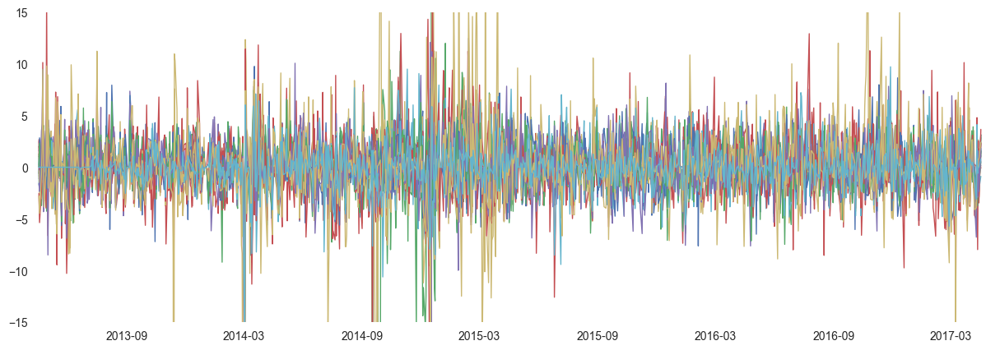

In [1602]:
ret1 = ret(pr)

In [1]:
cum_ret1 = cum_ret(pr)

NameError: name 'cum_ret' is not defined

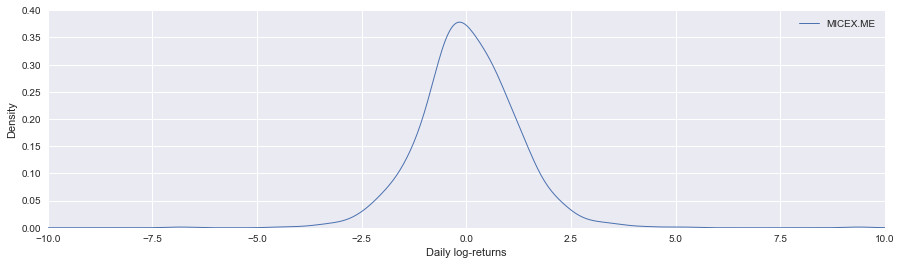

In [1615]:
density_returns(ret_ind1)

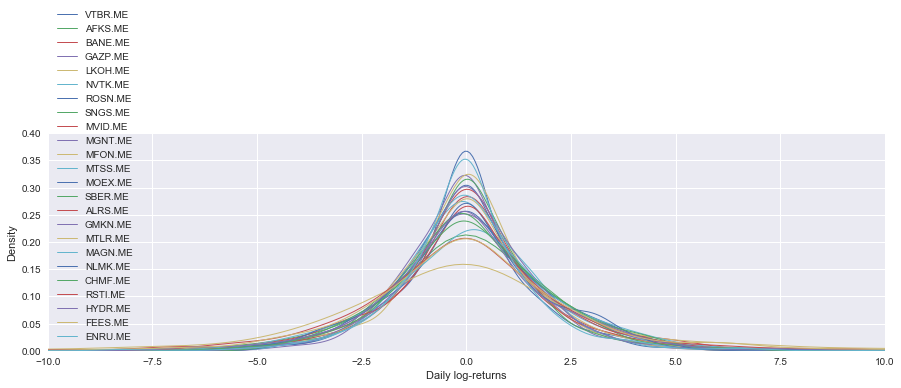

In [1614]:
density_returns(ret1)

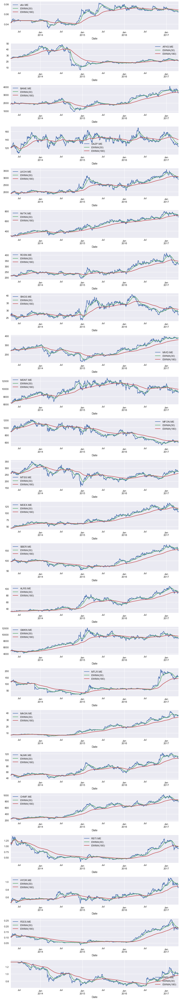

In [1454]:
gen_dyn(stock_list,pr)

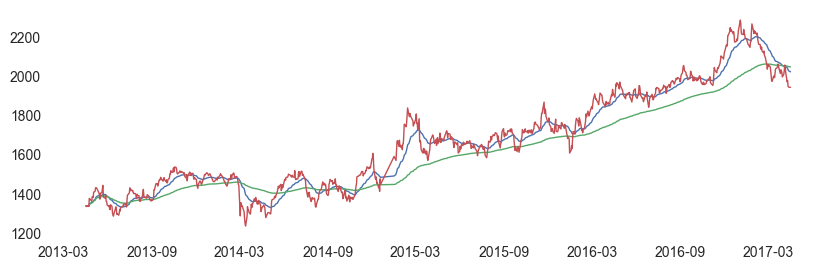

In [1466]:
ind_dyn(ind)

In [1612]:
sh_ch(ret1,ret_ind1)

Number of 1 day stocks shocks(>10%):  74
Number of 2 days stocks shocks(>15%):  64
Number of 3 days stocks shocks(>18%):  78
Number of 1 day index shocks(>3%):  19
Number of 2 days index shocks(>4%):  26
Number of 3 days index shocks(>5%):  27


# Крым - наш!

In [1479]:
shock1 = '2014-03-03'
windmin = -14
windpl = 42

D:\Max\Study\Programming\Anaconda43\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


,vtbr.ME,AFKS.ME,BANE.ME,GAZP.ME,LKOH.ME,NVTK.ME,ROSN.ME,SNGS.ME,MVID.ME,MGNT.ME,...,ALRS.ME,GMKN.ME,MTLR.ME,MAGN.ME,NLMK.ME,CHMF.ME,RSTI.ME,HYDR.ME,FEES.ME,ENRU.ME
Cum,-14.76,-11.15,-5.93,-13.37,-8.25,-18.40,-6.45,-4.94,-7.02,-10.47,...,3.89,12.58,-39.62,-13.87,-18.67,-10.43,-32.83,0.87,-17.90,-24.49
Min,-31.17,-27.99,-14.73,-22.05,-10.44,-25.01,-10.40,-7.63,-29.76,-15.05,...,-9.03,-1.00,-50.55,-34.73,-26.79,-24.08,-39.24,-9.40,-38.43,-30.01
Max,0.00,0.00,1.39,1.18,0.00,1.19,0.00,2.36,0.00,2.44,...,7.64,12.58,0.16,1.39,0.00,0.00,0.00,1.60,0.00,0.87


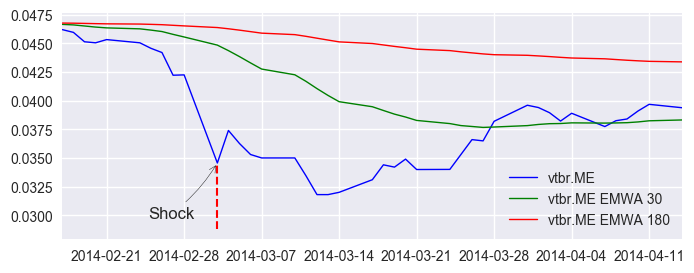

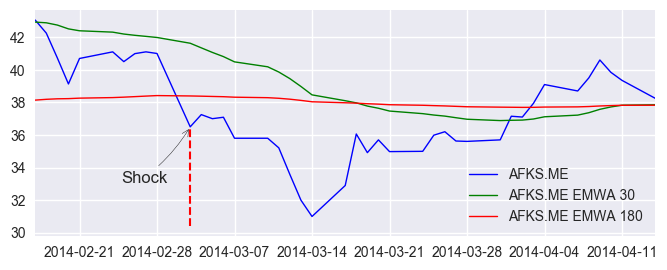

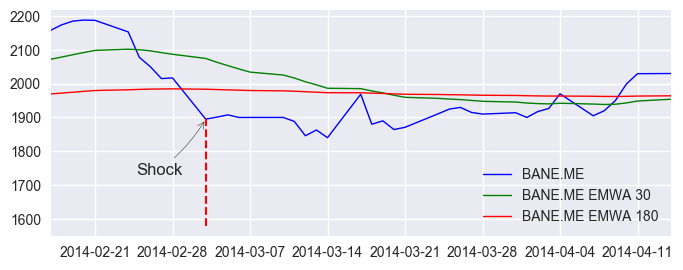

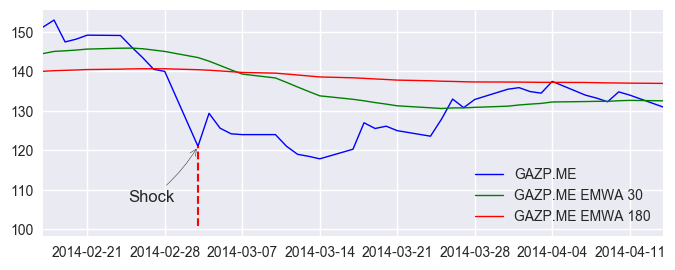

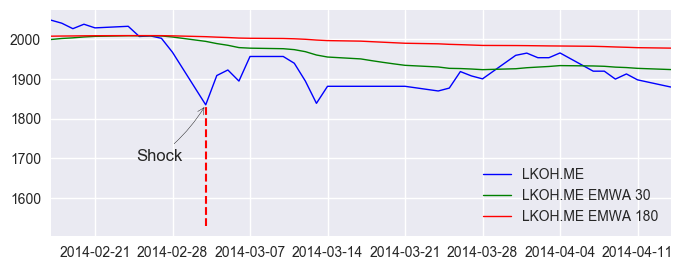

...

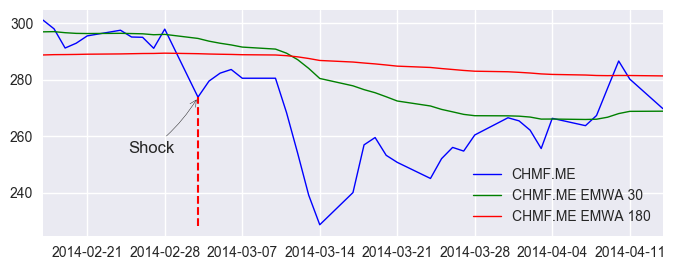

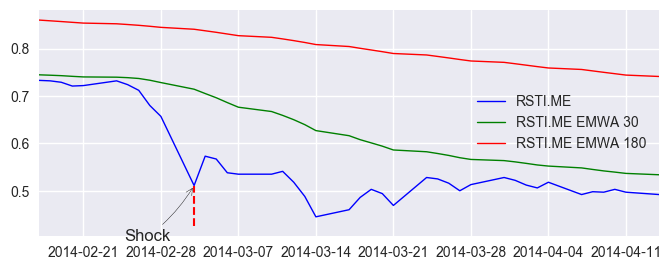

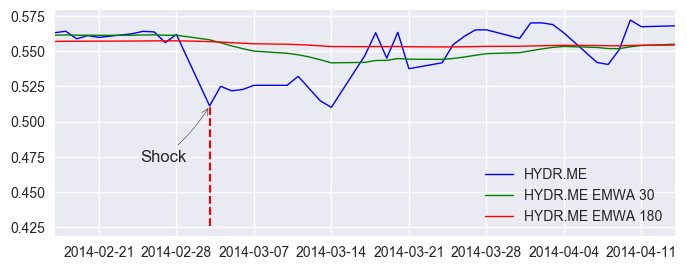

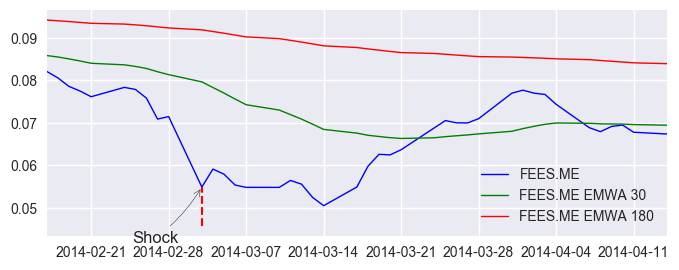

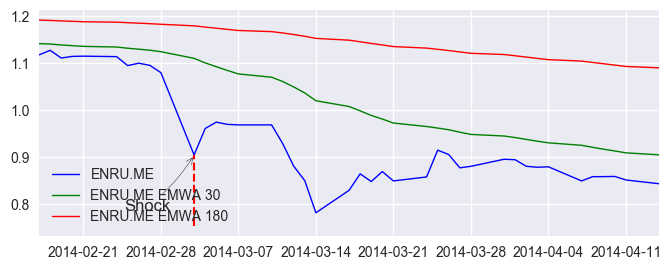

In [843]:
sh_a(shock1,windmin,windpl,stock_list,pr)

D:\Max\Study\Programming\Anaconda43\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


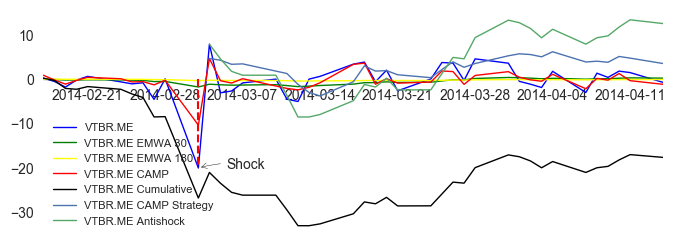

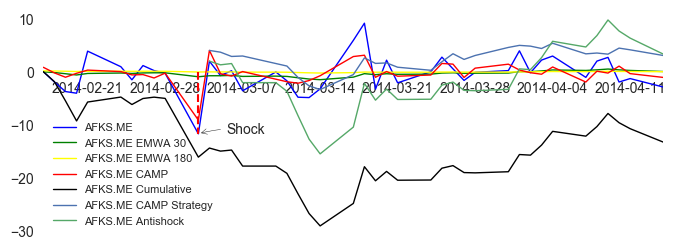

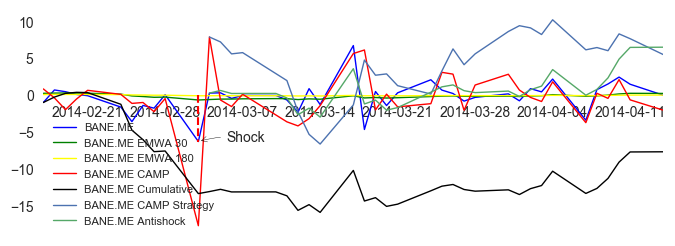

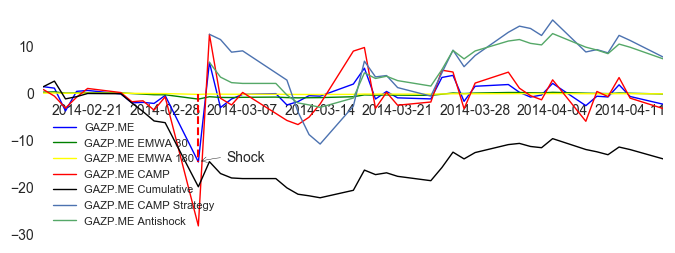

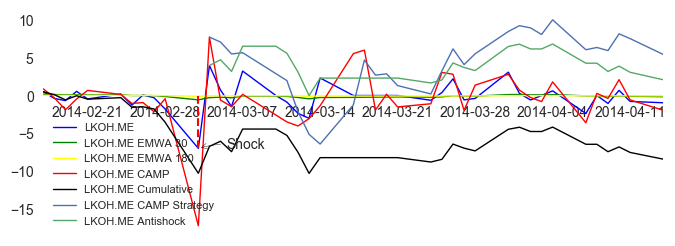

...

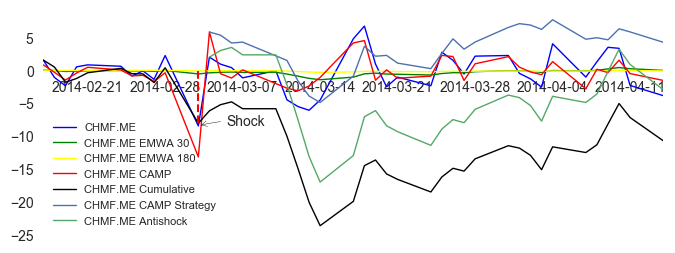

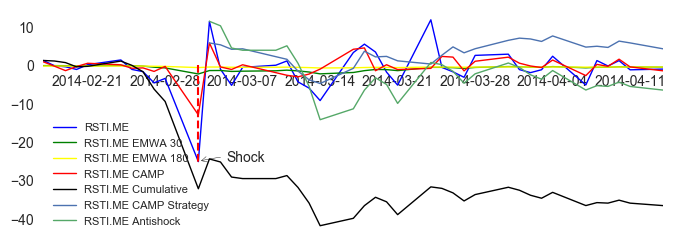

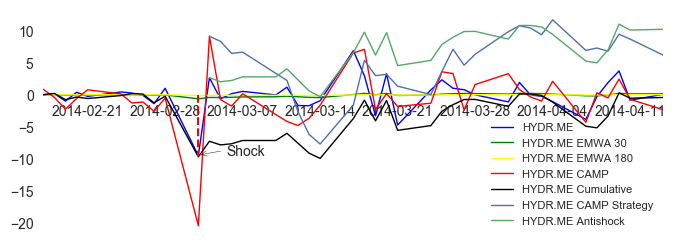

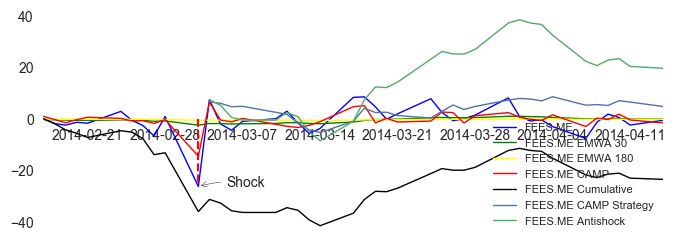

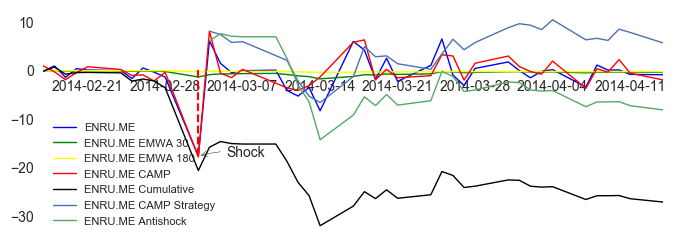

In [1605]:
sh2 = retsh_a(shock1,windmin,windpl,stock_list,ret1)

In [1291]:
strat = sh2[3:5]

D:\Max\Study\Programming\Anaconda43\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


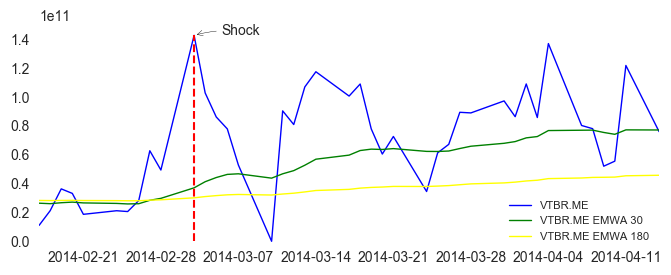

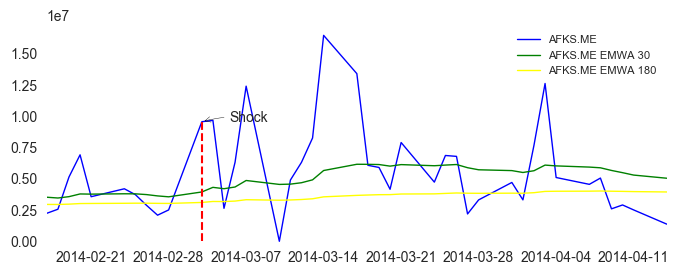

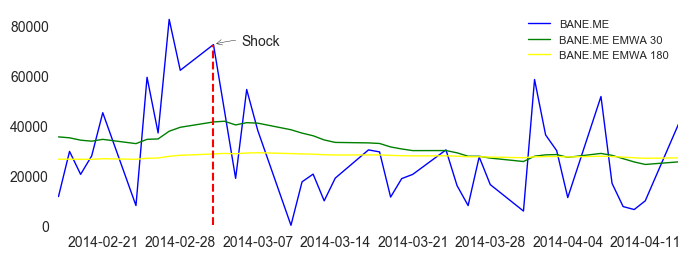

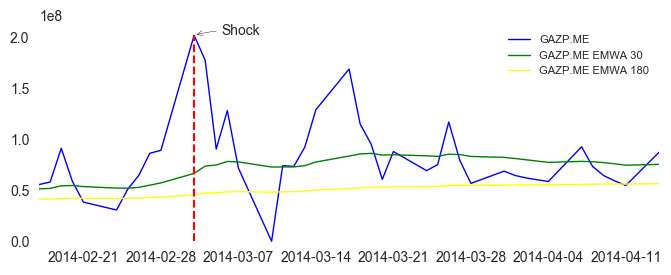

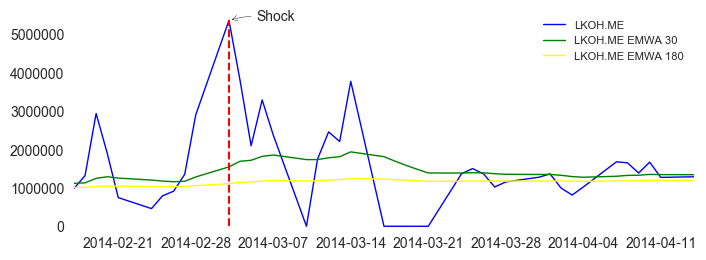

...

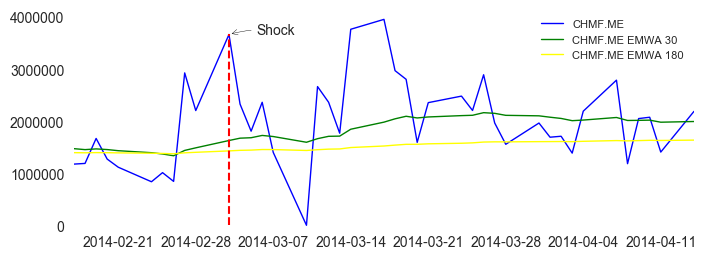

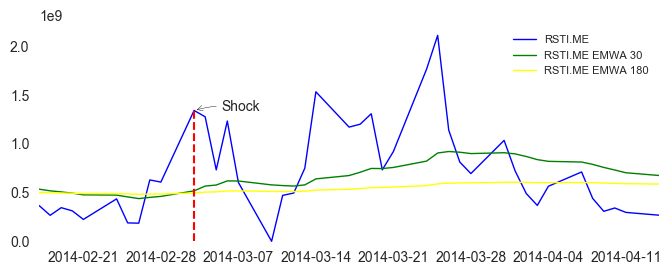

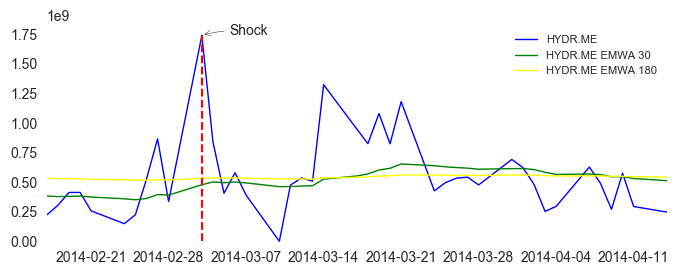

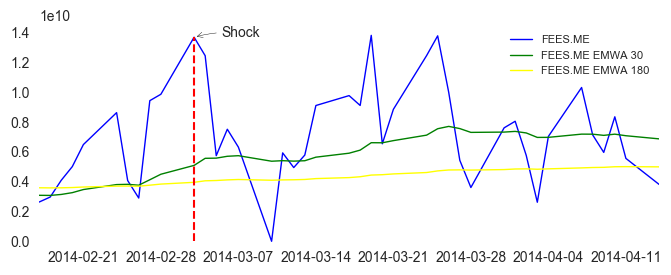

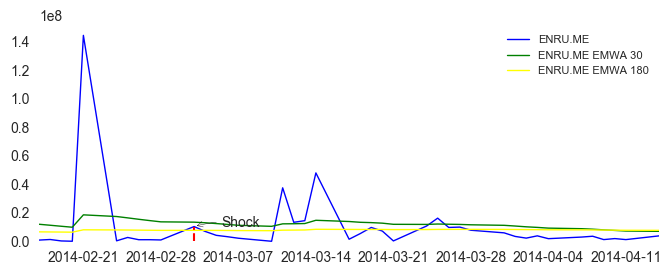

In [1589]:
sh3 = volsh_a(shock1,windmin,windpl,stock_list,vol)

# Евтушенкова - в тюрьму! - Сентябрь 2014

In [1481]:
shock2 = '2014-09-17'
windmin = -14
windpl = 42

D:\Max\Study\Programming\Anaconda43\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


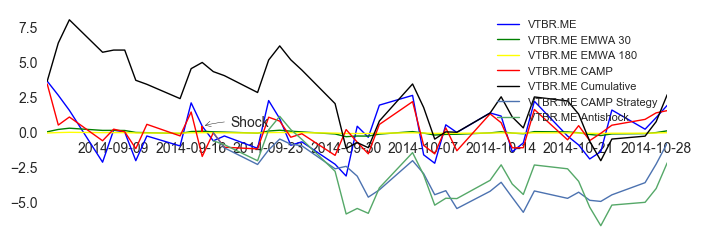

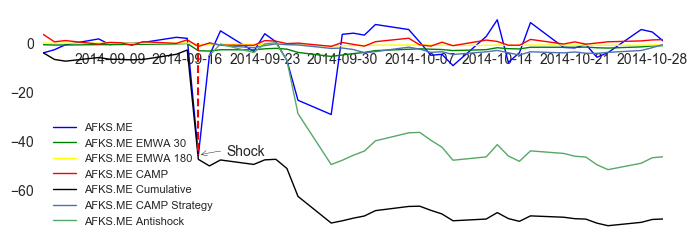

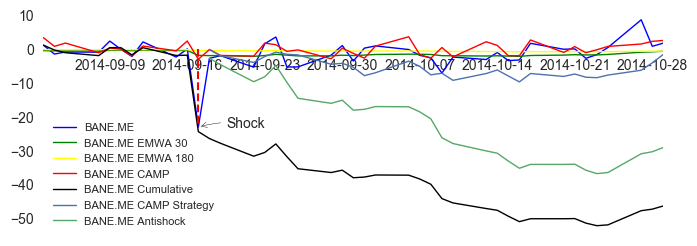

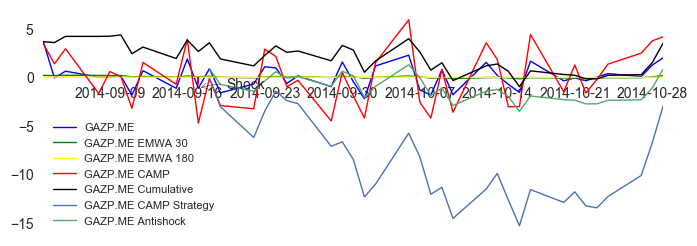

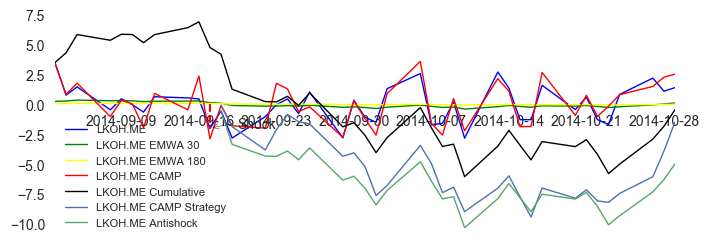

...

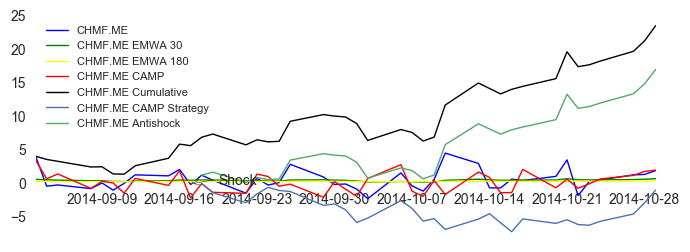

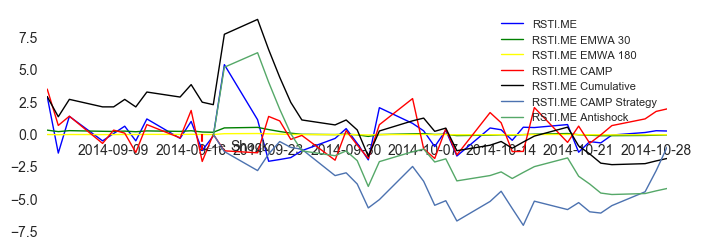

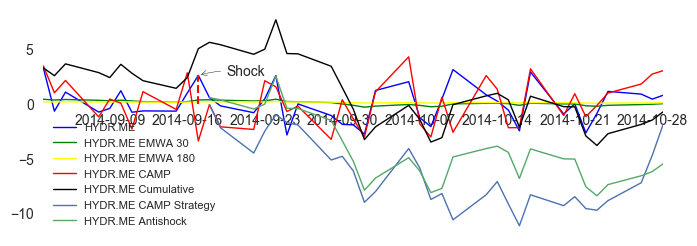

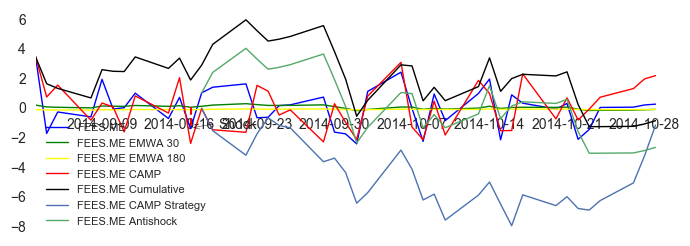

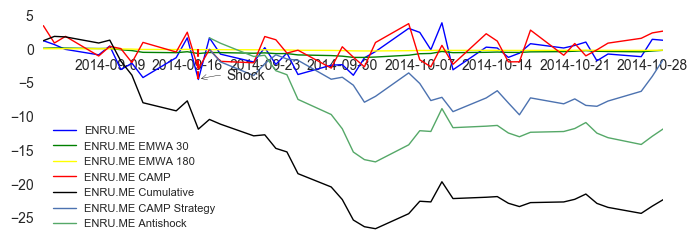

In [1606]:
sh2 = retsh_a(shock2,windmin,windpl,stock_list,ret1)

D:\Max\Study\Programming\Anaconda43\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


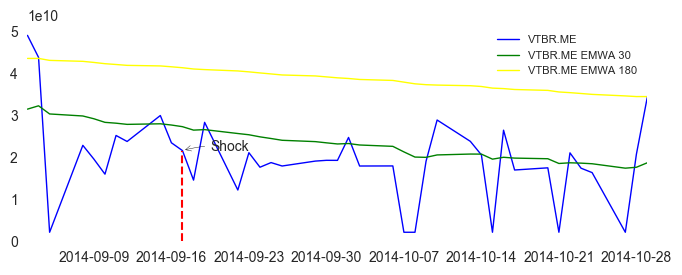

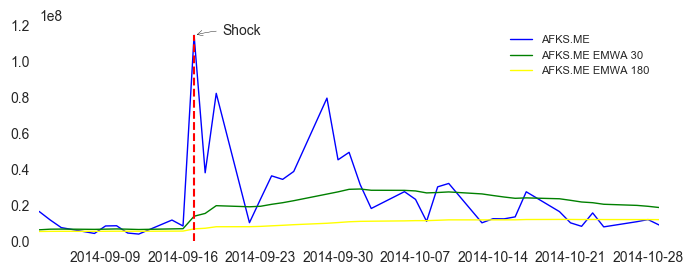

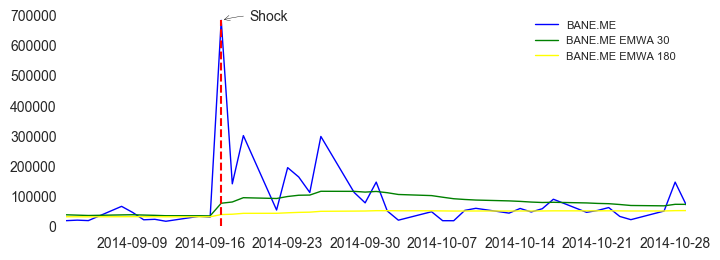

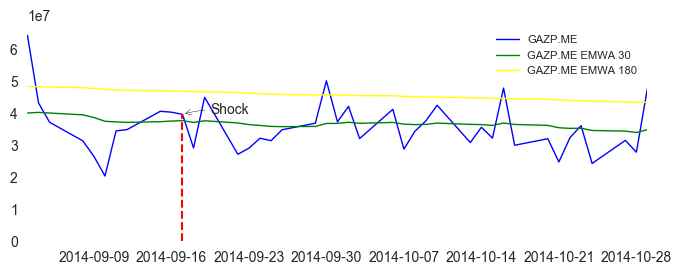

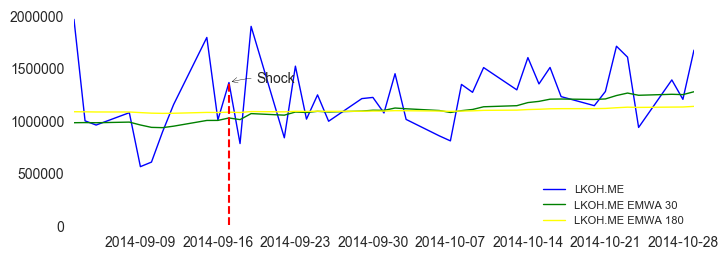

...

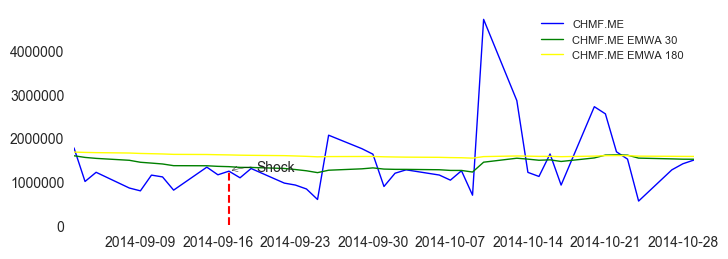

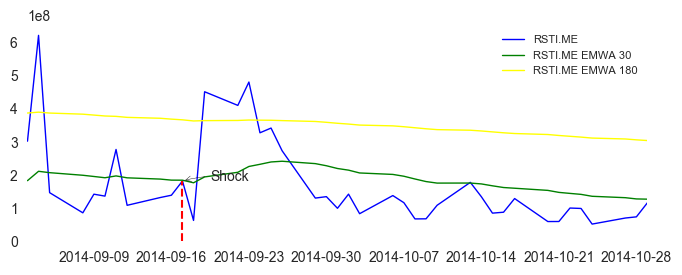

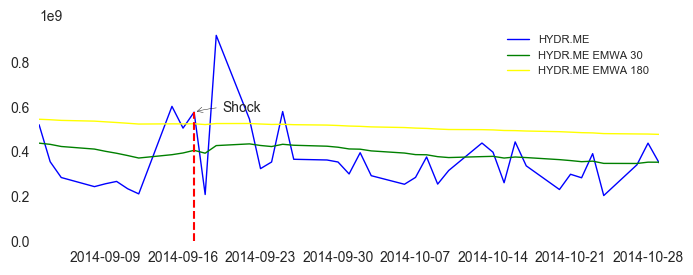

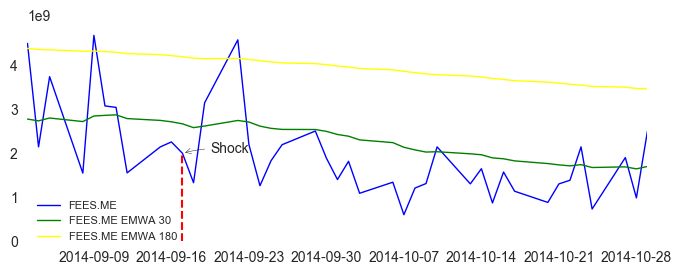

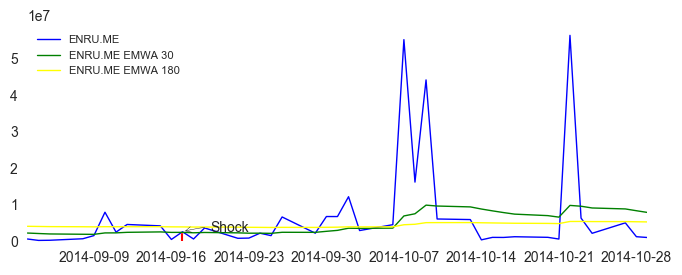

In [1590]:
sh3 = volsh_a(shock2,windmin,windpl,stock_list,vol)

# Падение рубля - Декабрь 2014

In [1483]:
shock3 = '2014-12-15'
windmin = -14
windpl = 42

D:\Max\Study\Programming\Anaconda43\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


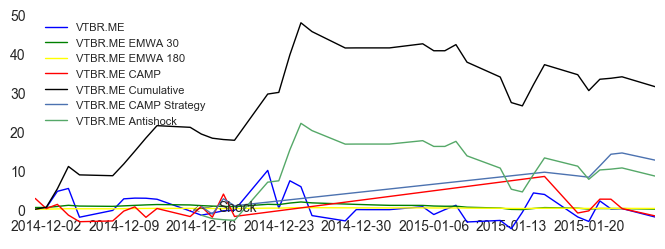

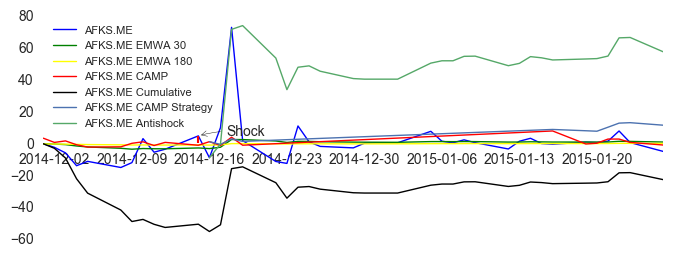

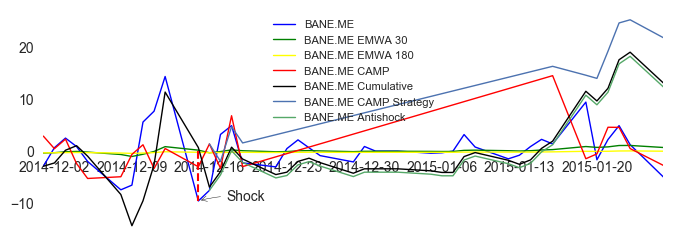

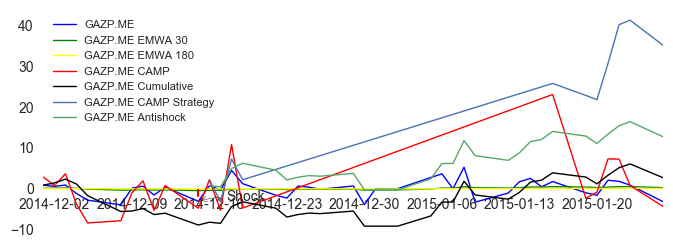

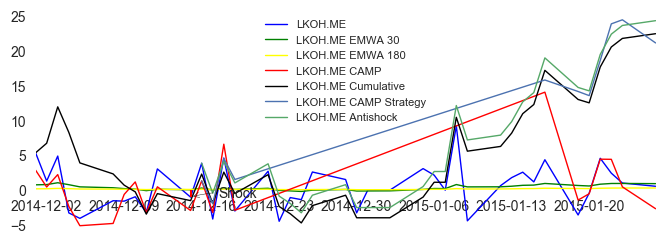

...

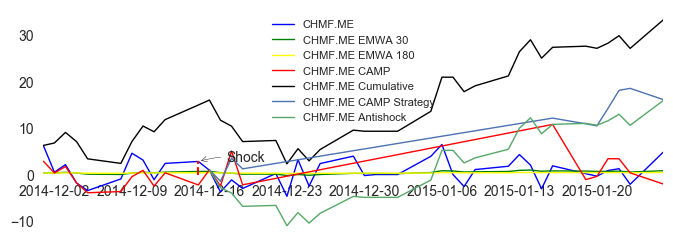

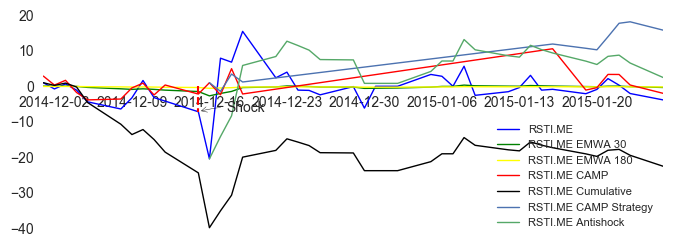

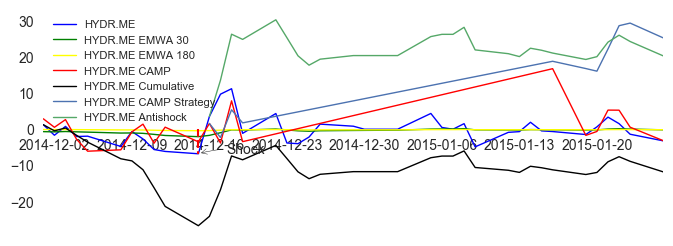

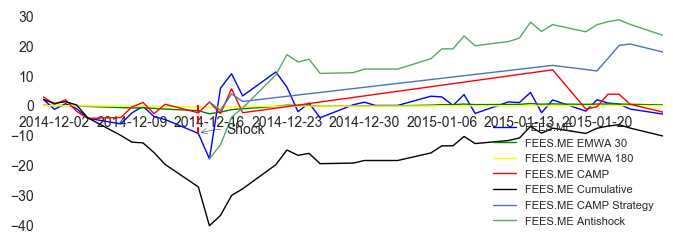

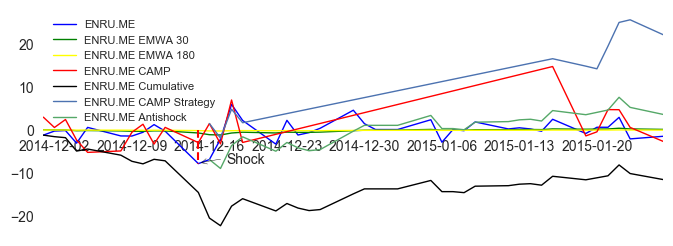

In [1607]:
sh2 = retsh_a(shock3,windmin,windpl,stock_list,ret1)

D:\Max\Study\Programming\Anaconda43\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


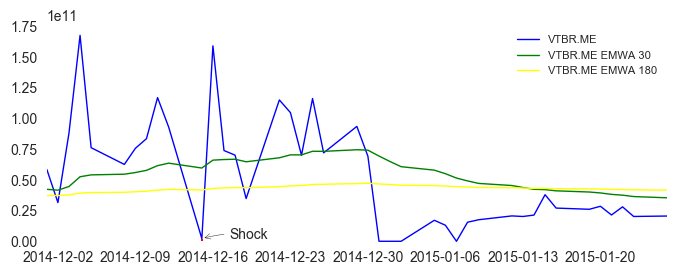

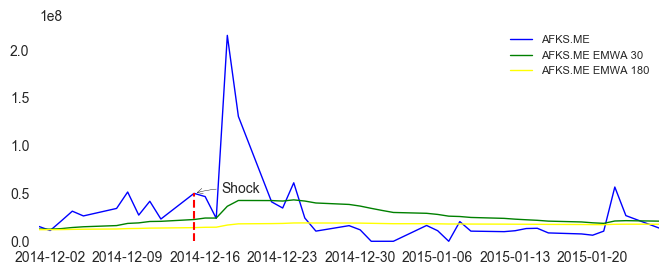

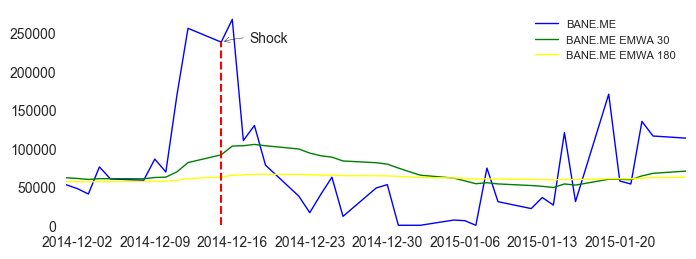

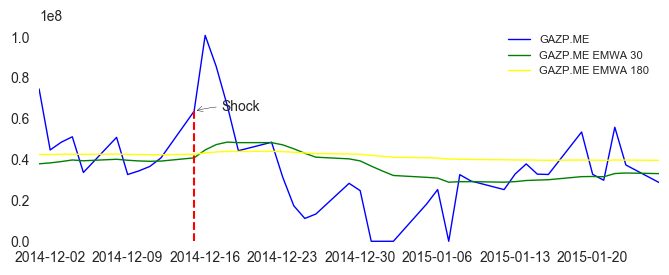

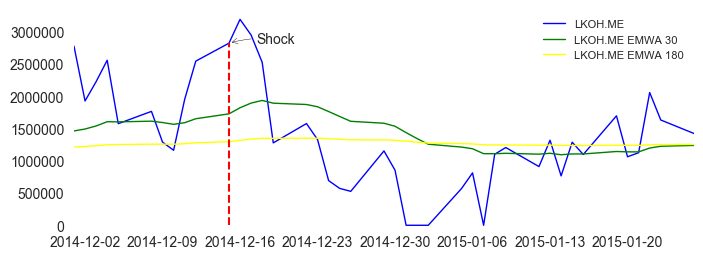

...

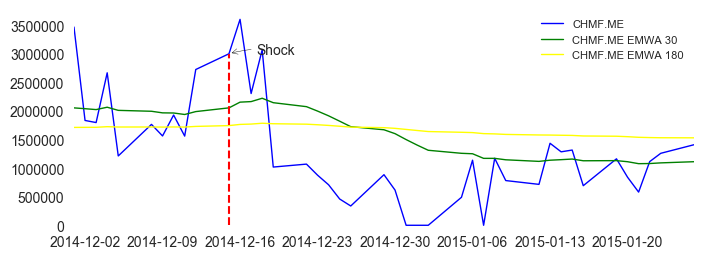

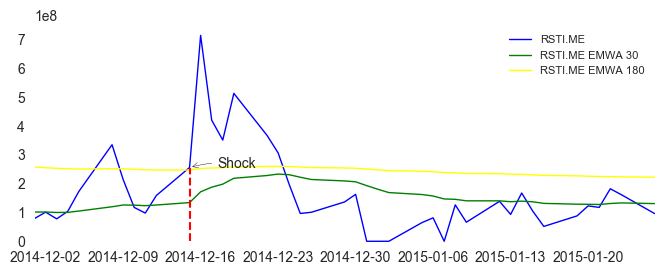

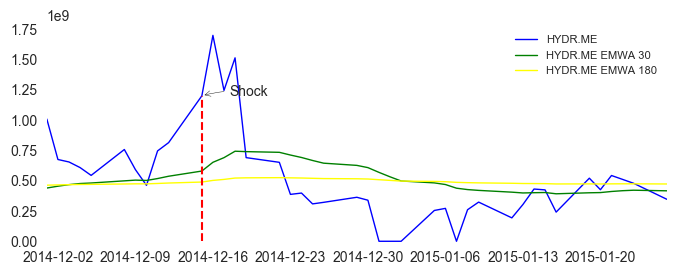

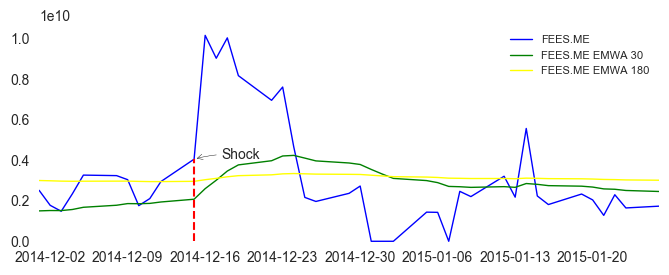

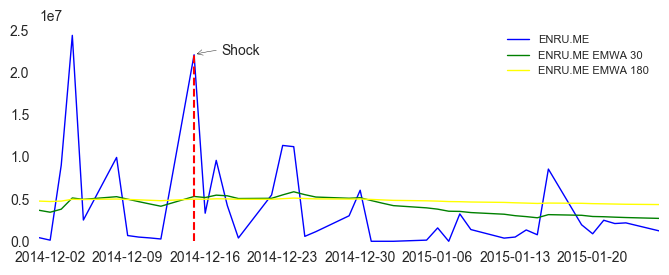

In [1591]:
sh3 = volsh_a(shock3,windmin,windpl,stock_list,vol)

# Мечел в дефолте - ноябрь 2013 и сентябрь 2014

In [1620]:
shock4 = '2013-11-13'
windmin = -14
windpl = 41

D:\Max\Study\Programming\Anaconda43\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


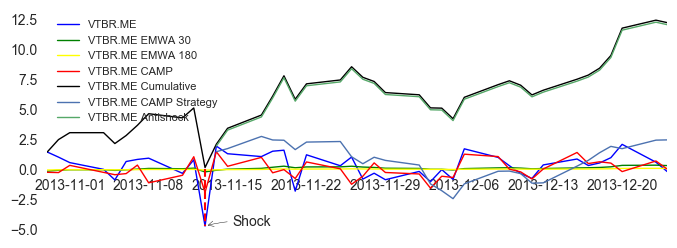

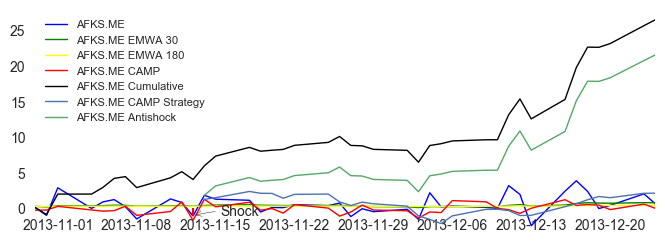

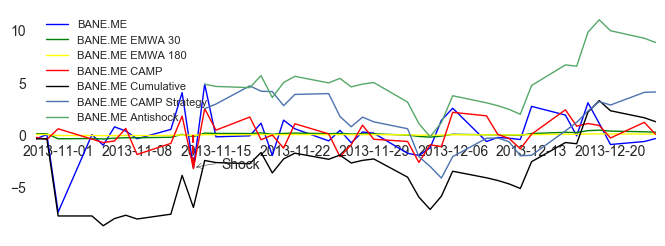

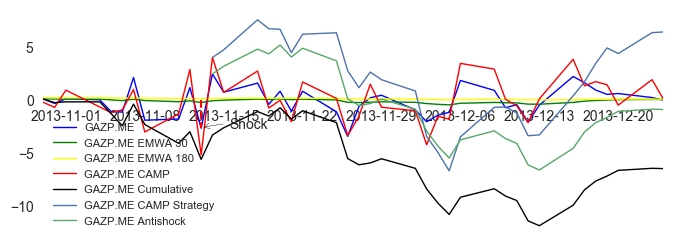

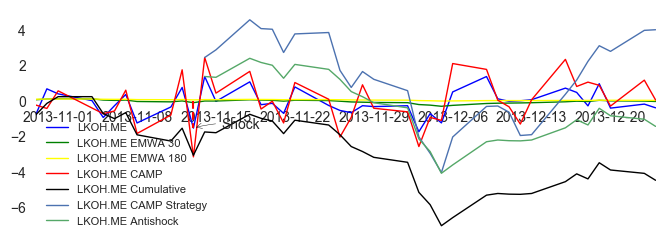

...

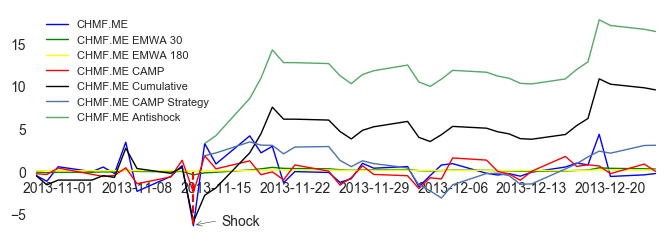

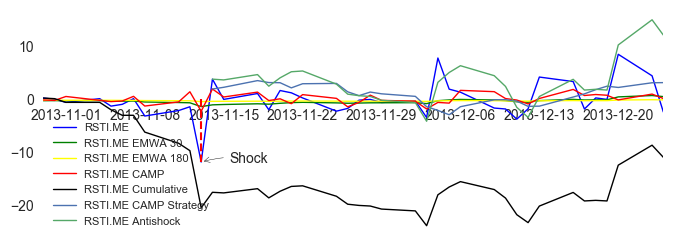

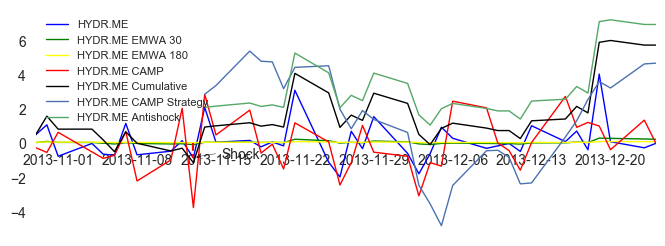

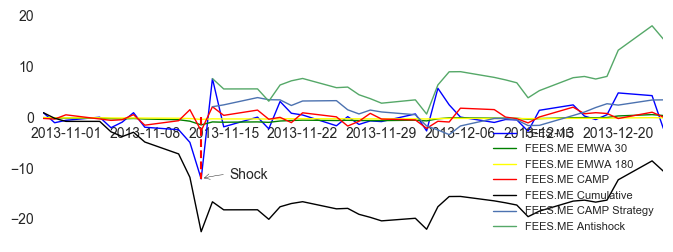

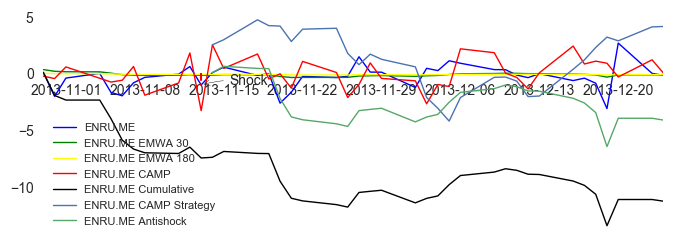

In [1621]:
sh2 = retsh_a(shock4,windmin,windpl,stock_list,ret1)

D:\Max\Study\Programming\Anaconda43\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


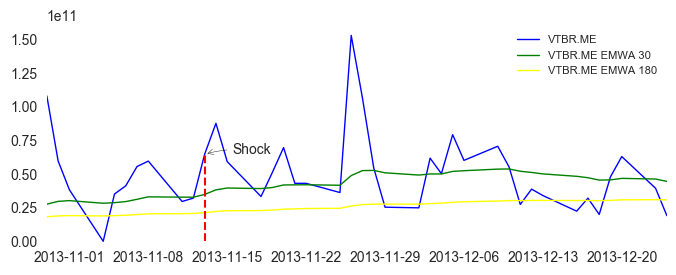

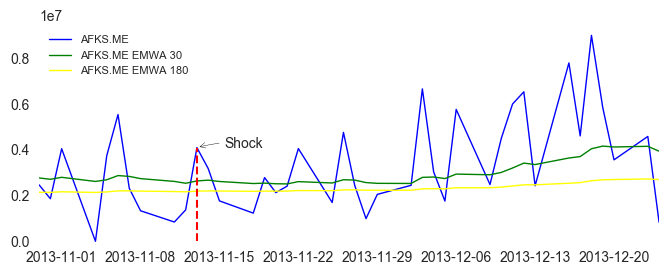

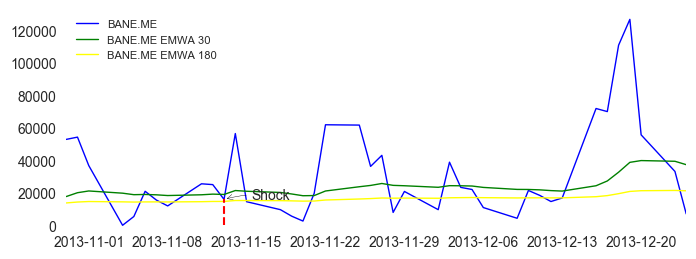

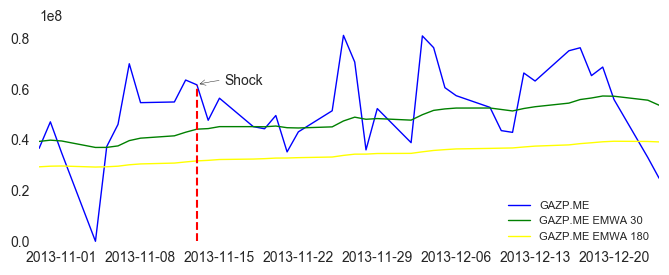

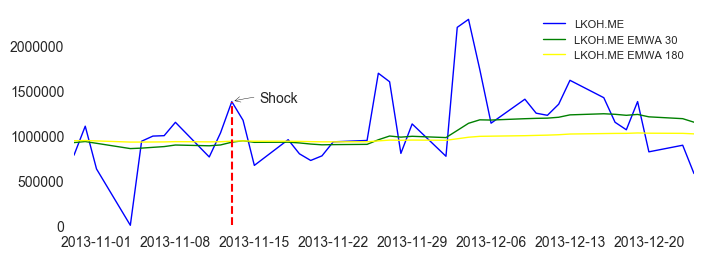

...

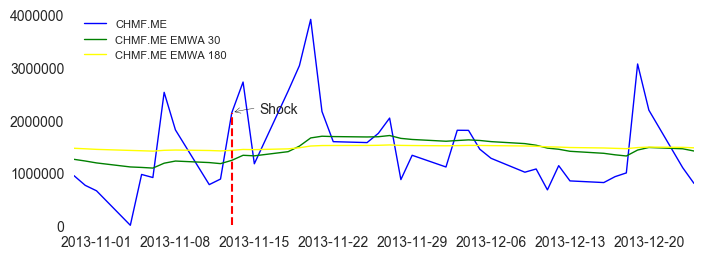

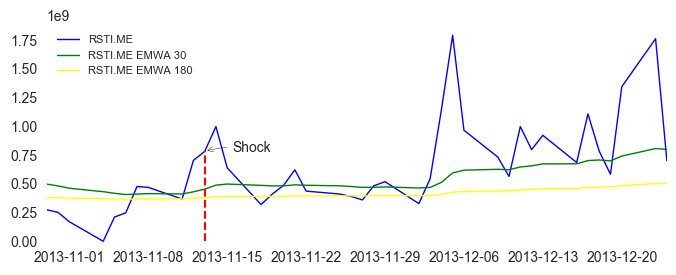

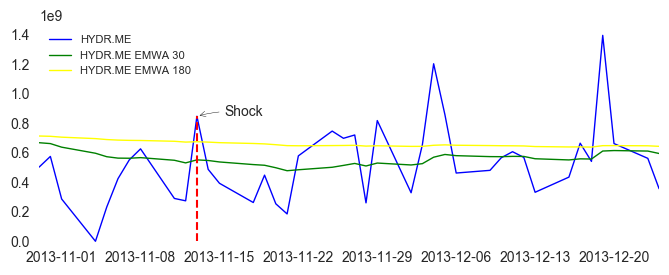

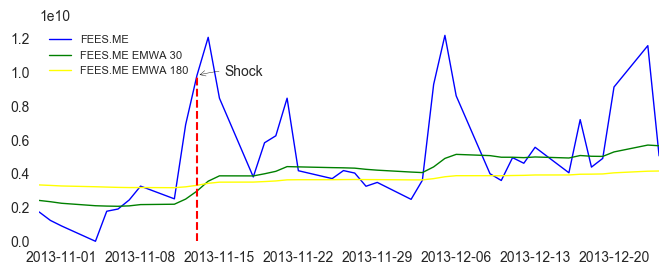

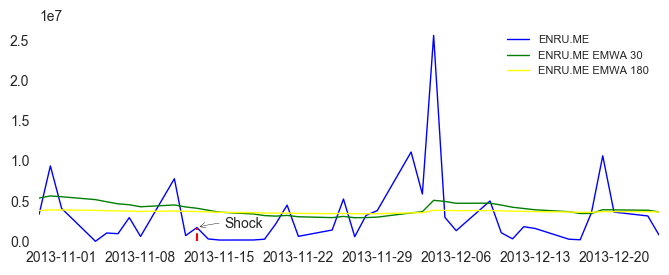

In [1622]:
sh3 = volsh_a(shock4,windmin,windpl,stock_list,vol)